## Partie CNN

# Initialisation pour Colab

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import sys
my_local_drive='/content/gdrive/My Drive/Colab Notebooks/ML_FDS'
sys.path.append(my_local_drive)

In [3]:
%cd $my_local_drive


/content/gdrive/My Drive/Colab Notebooks/ML_FDS


Importation des librairies
---



In [4]:
import os
import pandas as pd
import re
import numpy as np
import random
import zipfile
import requests
import io
import time
import math
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense
from sklearn.model_selection import train_test_split, StratifiedKFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import TextVectorization
from tensorflow.keras.utils import register_keras_serializable
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import load_model
from tensorflow.keras.metrics import Mean
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.utils import image_dataset_from_directory

from tensorflow.keras.utils import to_categorical

from tensorflow.keras import regularizers

from sklearn.metrics import classification_report, confusion_matrix,  ConfusionMatrixDisplay

# Pour utiliser au mieux le GPU
AUTOTUNE = tf.data.AUTOTUNE

# Récupération du jeu de données

Le jeu de données a été créé à partir de données de la plateforme de partage de photos [Flickr](https://www.flickr.com). 4 catégories de 150 images et textes ont été créées :    
- bike
- ball
- water
- dog  

Chacune des catégories contient 150 images et textes associés.
La cellule suivante permet d'extraire le jeu de données qui sera organisé de la manière suivante :     

  flickr_subset2
├─ captions.csv  
├─ captions  
│  ├─ bike100.txt  
│  ├─ bike200.txt  
│  └─ ...   
└─ images  
   ├─ bike  
   │   ├─ bike150.png  
   │  ├─ bike151.png  
   │  └─ ...  
   ├─ ball  
   │  ├─ ball150.png  
   │  ├─ ball151.png  
   │  └─ ...  
   ├─ water  
   │  ├─ water150.png  
   │  ├─ water151.png  
   │  └─ ...  
   └─ dog  
      ├─ dog150.png  
      ├─ dog151.png  
      └─ ...  

 Le fichier `caption.csv`permet de faire la correspondance entre les images, les textes. Il contient le label de la classe (e.g. dog, water, ball, bike) et le texte associé à l'image.   


In [5]:
url = "https://www.lirmm.fr/~poncelet/Ressources/flickr_subset2.zip"
target_dir = "flickr_subset2"

# Vérifie si le dossier existe déjà
if os.path.exists(target_dir) and os.path.isdir(target_dir):
    print("Données déjà disponibles dans :", target_dir)
else:
    print("Téléchargement de flickr_subset2.zip...")
    response = requests.get(url)
    if response.status_code == 200:
        print("Téléchargement réussi. Extraction...")
        with zipfile.ZipFile(io.BytesIO(response.content)) as zip_ref:
            # Extraire sans ajouter de sous-dossier supplémentaire
            for member in zip_ref.namelist():
                # Corrige les chemins pour ignorer un éventuel prefixe flickr_subset2/
                member_path = member
                if member.startswith("flickr_subset2/"):
                    member_path = member[len("flickr_subset2/"):]
                target_path = os.path.join(target_dir, member_path)

                # Si c'est un répertoire, on le crée
                if member.endswith("/"):
                    os.makedirs(target_path, exist_ok=True)
                else:
                    os.makedirs(os.path.dirname(target_path), exist_ok=True)
                    with zip_ref.open(member) as source, open(target_path, "wb") as target:
                        target.write(source.read())
        print(f"Données extraites dans : {target_dir}")
    else:
        print("Échec du téléchargement. Code HTTP :", response.status_code)


Données déjà disponibles dans : flickr_subset2


# Fonctions, classes et variables utiles pour la suite

Les cellules suivantes contiennent des fonctions et des classes qui seront utiles pour votre projet. Les classes sont extraites des différents guides qui sont mis à votre disposition. Nous les recopions ici pour éviter de les chercher.   

**Attention :** il est important que vous compreniez bien le fonctionnement des classes, aussi n'hésitez pas à vous reporter à [Ressources Deep Learning](https://gite.lirmm.fr/poncelet/deeplearning) où vous de plus amples informations sur leur fonctionnement et leur usage.

In [6]:


# FONCTIONS UTILES

def preview_images_from_dir(image_dir, image_size=(224, 224), n=12,
                            subset="training", seed=123):
    """
    Affiche n images avec leurs labels à partir d'un dossier
    (flow_from_directory).
    N'utilise PAS train_gen pour ne pas en avancer l'index.
    """
    # Générateur léger juste pour l'aperçu
    # Ici il y a une bonne indication si vous regardez bien pour la classif :)
    preview_datagen = ImageDataGenerator(validation_split=0.2, rescale=1./255)

    preview_gen = preview_datagen.flow_from_directory(
        image_dir,
        target_size=image_size,
        batch_size=n,
        class_mode="categorical",
        subset=subset,
        shuffle=True,
        seed=seed
    )

    imgs, y = next(preview_gen)    # imgs: (n, H, W, 3), y: one-hot
    class_names = list(preview_gen.class_indices.keys())
    labels = np.argmax(y, axis=1)

    rows = 3
    cols = int(np.ceil(n / rows))
    plt.figure(figsize=(4*cols, 4*rows))
    for i in range(min(n, imgs.shape[0])):
        plt.subplot(rows, cols, i+1)
        plt.imshow(imgs[i])
        plt.title(class_names[labels[i]])
        plt.axis("off")
    plt.tight_layout()
    plt.show()


Quelques variables qui peuvent être utiles pour le projet. Ces variables ont été définies pour l'apprentissage d'un modèle Clip réalisé avec les mêmes données. Elles devraient vous être utiles pour vos modèles. **Il est conseillé de conserver le nom des variables suivantes car nous vous donnerons un peu de code utilisant ces variables pour vous aider**.

In [7]:
# Répertoire cible pour sauvegarder vos modèles
model_dir = "./models_forclip"
os.makedirs(model_dir, exist_ok=True)

# Répertoire des données
dataset_dir = "./flickr_subset2"

# Répertoire des images
image_dir = os.path.join(dataset_dir, "images")
# Répertoire des captions
captions_dir = os.path.join(dataset_dir, "captions")

# Variables utiles
# Attention respecter bien l'ordre alphabétique des classes pour
# le générateur
class_names = ['ball', 'bike', 'dog', 'water']
# Pour les images
image_size=(224, 224)
image_shape = image_size + (3,)

# Pour les textes
# sequence_length = 32
# vocab_size = 10000
# num_heads = 4
# ff_dim = 256
# num_layers = 2

# # Pour les images et les textes dans le modèle CLIP
# embed_dim = 128

# Partie classification d'images

La cellule suivante affiche quelques images pour vous faire une idée de ce que vous manipulez.   

**Remarque :** n'hésitez pas à aller regarder comment les images sont obtenues pour les afficher ...

Found 480 images belonging to 4 classes.


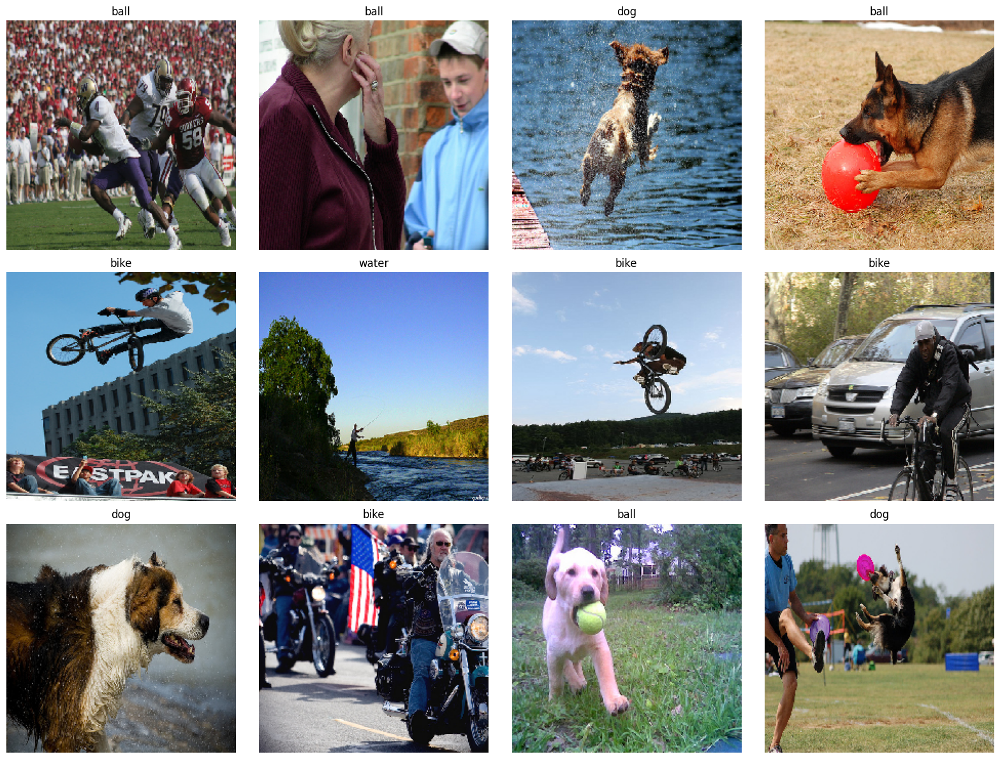

In [8]:
# Affichage des images
preview_images_from_dir(image_dir, image_size=image_size, n=12, subset="training", seed=50)

**Remarques :**
- Les images sont en couleurs et ont une taille de 224x224. Cela veut dire qu'elles prennent beaucoup de place et qu'il n'est pas possible de les charger directement en mémoire pour l'apprentissage ou la validation. Il est donc indispensable de les envoyer à la volée, i.e. par batches. **Astuce :** Chercher dans les guides comment faire pour envoyer les images à la volée à partir d'un répertoire.
- L'entraînement du modèle peut être long aussi il est préférable de le sauvegarder au fur et à mesure. Pour cela dans la cellule ci-dessous vous trouverez une autre fonction callback : `ModelCheckpoint`. Elle sauvegarde à chaque epoch dans model_path (qui est initialisé en début de cellule) le modèle Keras avec les meilleurs poids. Vous verrez que la mesure suivie est la val_loss. Si elle s'améliore le modèle est sauvegardé. L'avantage est qu'en cas de problème vous aurez toujours une version sauvegardé.
- Pour votre loss, vous pourrez utiliser `loss="categorical_crossentropy`. Comme optimizer, utiliser `optimizer="adam`.    

**Conseil :** l'apprentissage d'un modèle peut être très long. Il est important avant de mettre un trop grand nombre d'epochs de vérifier que la sauvegarde de votre modèle est bien réalisée et que vous pouvez le recharger. Il n'y a rien de pire que d'attendre des heures et de se rendre compte qu'on a mal sauvegardé le modèle et qu'il faut tout recommencer !!! Normalement ici les fonctions (correspondant aux couches) utilisées sont "*built-in*", i.e. Keras les connait et ne posera pas de problèmes, il sait les sérialiser. Par contre dès que vous allez devoir définir des couches plus personnalisées il va falloir penser à mettre des *décorateurs* qui préciseront comment sérialiser le modèle pour le sauvegarder. Cela sera très utile pour la suite. Vous pouvez voir dans la partie classe utile pour la suite des exemples de décorateur (e.g `@tf.keras.utils.register_keras_serializable()`).  

In [9]:
!ls ./flickr_subset2/

 captions	        captions.csv	  images     test_data	  vocab.txt
'captions (1).gsheet'   captions.gsheet   __MACOSX   train_data


Found 600 files belonging to 4 classes.
Using 480 files for training.
Found 600 files belonging to 4 classes.
Using 120 files for validation.


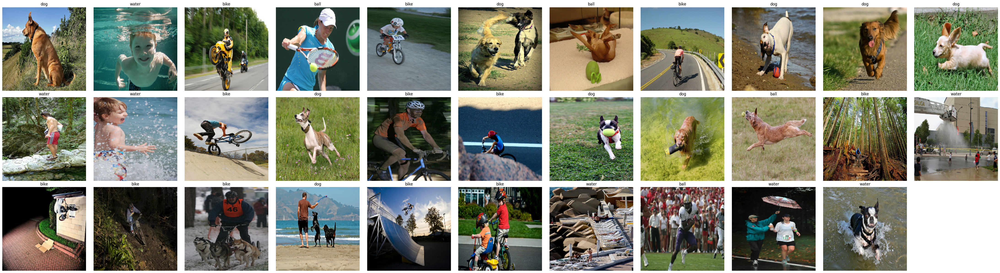

In [11]:
# Generation d'images à la volée à partir d'un répertoire

batch_size = 32
seed = 5

# data_augmentation = tf.keras.Sequential([
#  layers.RandomFlip("horizontal"),
#  layers.RandomFlip("vertical"),
#  layers.RandomRotation(0.1),
#  layers.RandomZoom(0.1),
# ])

train_dataset = image_dataset_from_directory(
      "./flickr_subset2/images/",
      image_size=(224,224),
      validation_split=0.2,
      subset="training",
      batch_size=batch_size,
      seed=seed
)

validation_dataset = image_dataset_from_directory(
      "./flickr_subset2/images/",
      image_size=(224,224),
      validation_split=0.2,
      subset="validation",
      batch_size=batch_size,
      seed=seed
)



class_names = train_dataset.class_names  # class names from the dataset

# train_dataset = train_dataset.map(lambda image, label: (data_augmentation(image, training=True), label))

# Take one batch
for imgs, labels in train_dataset.take(1):  # imgs: (batch_size, 224, 224, 3)
    #imgs = data_augmentation(imgs)

    n = imgs.shape[0]  # batch size
    labels_idx = labels.numpy()  # if labels are integer indices
    rows = 3
    cols = int(np.ceil(n / rows))
    plt.figure(figsize=(4*cols, 4*rows))

    for i in range(n):
        plt.subplot(rows, cols, i+1)
        plt.imshow(imgs[i].numpy().astype("uint8"))
        plt.title(class_names[labels_idx[i]])
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [12]:
# Normalize images

train_dataset = train_dataset.map(lambda image, label: (tf.cast(image/255. ,tf.float32), label))
validation_dataset = validation_dataset.map(lambda image, label: (tf.cast(image/255. ,tf.float32), label))

Split en jeu de validation et jeu de test (80% train, 10% validation, 10% test)

In [13]:
val_batches = tf.data.experimental.cardinality(validation_dataset)

test_dataset = validation_dataset.take(val_batches // 2)
validation_dataset = validation_dataset.skip(val_batches // 2)

Définition du modèle CNN

In [35]:
def define_model(image_size, number_of_classes, learning_rate=1e-3):
  input = Input(shape=(image_size,image_size,3))

  convolution_layer1 = Conv2D(filters=32, kernel_size=3, padding="same", activation="relu", kernel_regularizer=regularizers.l2(0.001))(input)
  max_pooling_layer1 = MaxPooling2D(pool_size=(2, 2))(convolution_layer1)

  convolution_layer2 = Conv2D(filters=64, kernel_size=3, padding="same", activation="relu", kernel_regularizer=regularizers.l2(0.001))(max_pooling_layer1)
  max_pooling_layer2 = MaxPooling2D(pool_size=(2, 2))(convolution_layer2)

  convolution_layer3 = Conv2D(filters=128, kernel_size=3, padding="same", activation="relu", kernel_regularizer=regularizers.l2(0.001))(max_pooling_layer2)
  max_pooling_layer3 = MaxPooling2D(pool_size=(2, 2))(convolution_layer3)

  flatten_layer = Flatten()(max_pooling_layer3)

  dense1 = Dense(128, activation="relu", kernel_regularizer=regularizers.l2(0.001))(flatten_layer)
  x = Dropout(0.5)(dense1)
  output = Dense(number_of_classes, activation="softmax")(x)

  model = Model(inputs=input, outputs=output, name="cnn_minimal")
  model.compile(optimizer=Adam(learning_rate),
                loss="sparse_categorical_crossentropy",
                metrics=["accuracy"])

  model.summary()

  return model

In [15]:
def plot_history_simple(history):
    """
    Trace côte à côte les courbes Loss et Accuracy (train/val si dispo)
    à partir d'un objet Keras History.
    """
    hist = history.history

    # compatibilité anciennes versions ("acc"/"val_acc")
    acc_key = "accuracy" if "accuracy" in hist else "acc"
    val_acc_key = "val_accuracy" if "val_accuracy" in hist else "val_acc"

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # --- Loss ---
    if "loss" in hist:
        axes[0].plot(hist["loss"], label="train")
    if "val_loss" in hist:
        axes[0].plot(hist["val_loss"], label="val")
    axes[0].set_title("Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()

    # --- Accuracy ---
    if acc_key in hist:
        axes[1].plot(hist[acc_key], label="train")
        if val_acc_key in hist:
            axes[1].plot(hist[val_acc_key], label="val")
        axes[1].set_title("Accuracy")
        axes[1].set_xlabel("Epoch")
        axes[1].set_ylabel("Accuracy")
        axes[1].legend()
    else:
        axes[1].set_visible(False)  # si pas d'accuracy, on masque le 2e plot

    plt.tight_layout()
    plt.show()

In [41]:
save_dir = model_dir
os.makedirs(save_dir, exist_ok=True)

image_size = 224
model = define_model(image_size, len(class_names), 1e-3)

Model: "cnn_minimal"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │    12,845,184 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,938,948 (49.36 MB)

 Trainable params: 12,938,948 (49.36 MB)

 Non-trainable params: 0 (0.00 B)

## Importation du modèle CNN

In [78]:
os.listdir("models_forclip")

['first_test_classif_smallbert.weights.h5',
 'first_test_cnn_minimal.weights.h5',
 'cnn_minimal_1763719508.829224.weights.h5',
 'cnn_minimal_1763719850.4419556.weights.h5',
 'cnn_minimal_1763720185.9780257.weights.h5',
 'cnn_minimal_1763721091.1551702.weights.h5',
 'cnn_minimal_1763937386.8258066.weights.h5',
 'cnn_minimal_1763970028.2645557.weights.h5',
 'cnn2_1763970323.4013007.weights.h5',
 'cnn3_1763970564.2227197.weights.h5',
 'cnn4_1763981383.4721837.weights.h5',
 'cnn4_1763981557.679307.weights.h5',
 'cnn4_1763982529.7232642.weights.h5',
 'cnn5_1763983169.6889365.weights.h5',
 'cnn5_1763983364.862954.weights.h5',
 'cnn6_1763983784.077346.weights.h5',
 'cnn6_1763983812.3553495.weights.h5',
 'cnn6_1763983851.4208121.weights.h5',
 'cnn6_1763983906.779247.weights.h5',
 'cnn6_1763983944.0013702.weights.h5',
 'cnn6_1763984021.844856.weights.h5',
 'cnn6_1763984164.908875.weights.h5',
 'cnn6_1763984230.3729537.weights.h5',
 'cnn6_1763984345.826663.weights.h5',
 'cnn6_1764779366.678953.w

In [127]:
# Load model weigths

import_name_model = "cnn6_1764780871.789581.weights.h5"
model_path = os.path.join(save_dir, import_name_model)

model.load_weights("./" +model_path)

## Entrainement du modèle CNN


Epoch 1/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 282ms/step - accuracy: 0.2195 - loss: 2.0942 - val_accuracy: 0.3393 - val_loss: 1.7175
Epoch 2/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 219ms/step - accuracy: 0.3665 - loss: 1.6892 - val_accuracy: 0.2857 - val_loss: 1.6388
Epoch 3/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 189ms/step - accuracy: 0.3733 - loss: 1.5672 - val_accuracy: 0.2679 - val_loss: 1.5913
Epoch 4/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - accuracy: 0.4624 - loss: 1.4408 - val_accuracy: 0.3214 - val_loss: 1.5400
Epoch 5/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 6s 382ms/step - accuracy: 0.5532 - loss: 1.3131 - val_accuracy: 0.4464 - val_loss: 1.4728
Epoch 6/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 203ms/step - accuracy: 0.5964 - loss: 1.1651 - val_accuracy: 0.3393 - val_loss: 1.4927
Epoch 7/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - accuracy: 0.6685 - loss: 1.1309 - val_accuracy: 0.4107 - val_loss: 1.5798
Epoch 8/40
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step - accuracy: 0.6778 - loss: 1.0193 - val_accuracy: 0.

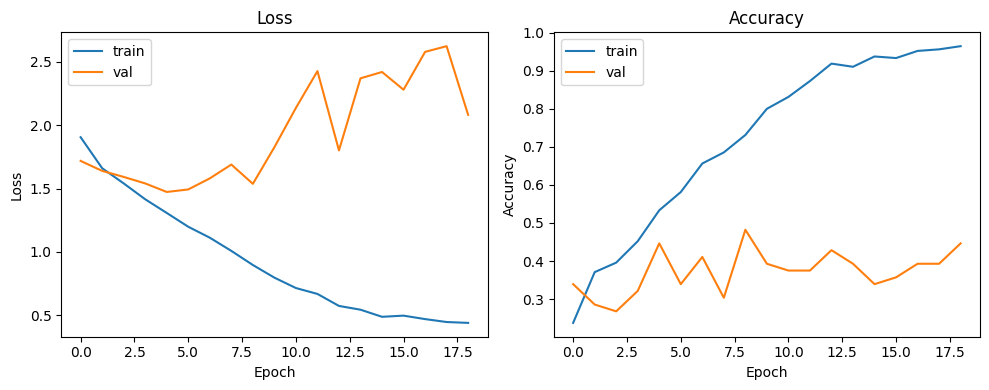

In [42]:
save_name_model = f"cnn6_{time.time()}.weights.h5"
save_model_path = os.path.join(save_dir, save_name_model)

# Entraînement
epochs = 40

callbacks = [
  EarlyStopping(
    monitor="val_accuracy",      # ou "val_accuracy"
    patience=10,             # nb d'epochs sans amélioration avant arrêt
    min_delta=0.001,           # amélioration minimale à considérer
    mode="max",              # "min" pour une loss, "max" pour une accuracy
    restore_best_weights=True,
    verbose=1
  ),
  ModelCheckpoint(
        save_model_path,
        monitor="val_accuracy",
        mode="max",
        save_best_only=True,
        save_weights_only=True
  )
]

history = model.fit(
  train_dataset,
  validation_data=validation_dataset,
  epochs=epochs,
  callbacks=callbacks,
  verbose=1
)

# Courbes loss/accuracy
plot_history_simple(history)

## Evaluation du modèle

In [43]:
y_true = []
y_pred = []

for images, labels in test_dataset:
    y_true.extend(labels.numpy())

    preds = model.predict(images, verbose=0)

    predicted_classes = np.argmax(preds, axis=-1)
    y_pred.extend(predicted_classes)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

In [44]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.38      0.57      0.46        14
           1       0.75      0.35      0.48        17
           2       0.48      0.61      0.54        18
           3       0.50      0.40      0.44        15

    accuracy                           0.48        64
   macro avg       0.53      0.48      0.48        64
weighted avg       0.53      0.48      0.48        64



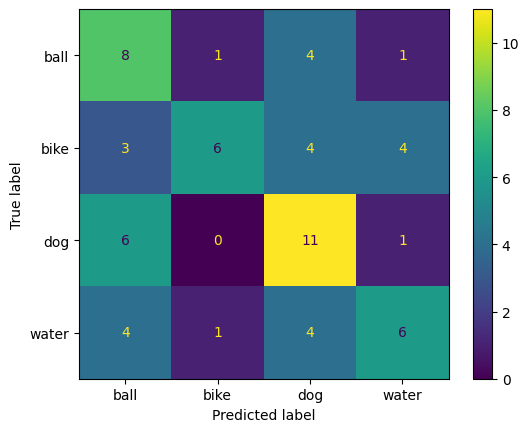

In [45]:
ConfusionMatrixDisplay(confusion_matrix(y_true, y_pred), display_labels=class_names).plot()